In [ ]:
%cd /home/sasedov/StyleDomain/SimilarDomains

In [ ]:
from core.featureshift_dataset import FeatureShiftImageDataset

from omegaconf import OmegaConf
from pathlib import Path
import yaml

In [16]:
# config_path = Path("configs/featureshift_dataset_config.yaml")
config_path = Path("configs/featureshift_config.yaml")
config = OmegaConf.load(config_path)

In [17]:
dataset = FeatureShiftImageDataset(config.train_dataset)

In [25]:
from torchvision import transforms
from torchvision.utils import make_grid
import numpy as np
from PIL import ImageFont
from tqdm import tqdm

from visualize import stack_to_grid_with_names


item = dataset[0]

images = []
e4e_inversions = []
fse_inversions = []

for ind in tqdm(range(100)):
    item = dataset[ind]
    images.append(item["image"])
    e4e_inversions.append(item["e4e_inversion"])
    fse_inversions.append(item["fse_inversion"])

def to_im_transform(torch_image, **kwargs):
    return transforms.ToPILImage()(
        make_grid(torch_image, value_range=(-1, 1), normalize=True, **kwargs)
    )
 


100%|██████████| 100/100 [00:19<00:00,  5.09it/s]


In [26]:
import numpy as np

np_images = np.array([np.array(x) for x in images])
images_mean = np.mean(np_images, axis=(0,2,3))

np_images = np.array([np.array(x) for x in e4e_inversions])
e4e_inversions_mean = np.mean(np_images, axis=(0,2,3))

np_images = np.array([np.array(x) for x in fse_inversions])
fse_inversions_mean = np.mean(np_images, axis=(0,2,3))

images_mean, e4e_inversions_mean, fse_inversions_mean

(array([ 0.029073  , -0.14206408, -0.20872332], dtype=float32),
 array([ 0.01827111, -0.15478678, -0.21936929], dtype=float32),
 array([-0.00120671, -0.16570675, -0.22451645], dtype=float32))

In [27]:
item["filename"]

'47156'

In [28]:
image_size = 1024
row_stack = [[]]
for im_tensor in [item["image"], item["e4e_inversion"], item["fse_inversion"]]:
    row_stack[-1].append(np.array(to_im_transform(im_tensor)))

stacked_image = stack_to_grid_with_names(
    imgs_list=row_stack, H=image_size, W=image_size,
    row_names=None,
    column_names=None,
    font=ImageFont.truetype("/home/sasedov/Times.ttf", 25 * image_size // 256),
)

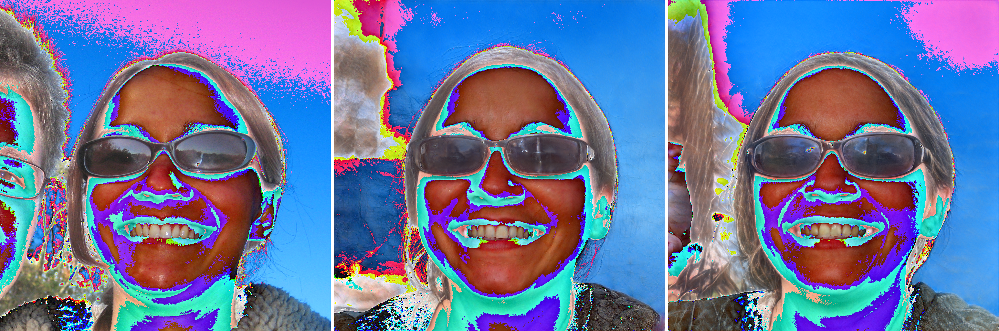

In [24]:
stacked_image

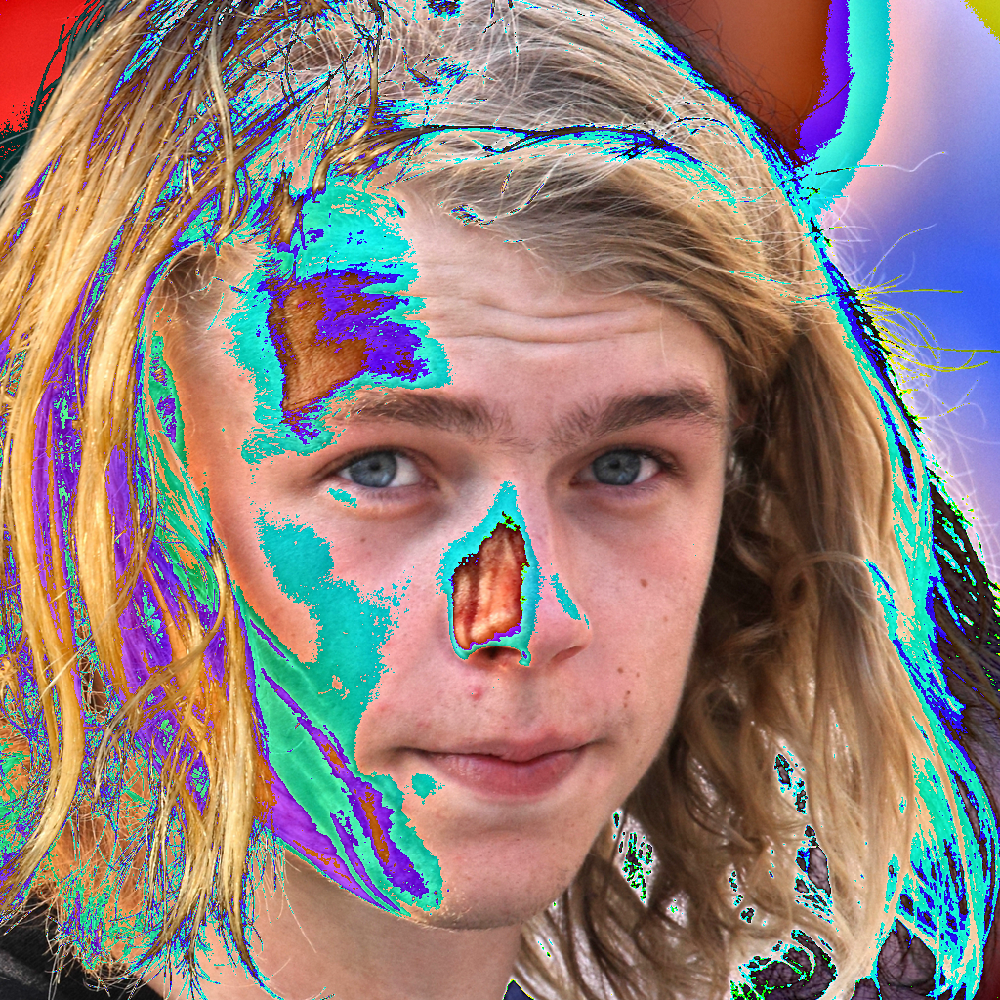

In [32]:
to_im_transform(item["image"])

In [34]:
from PIL import Image
image = Image.open("/home/aalanov/Bobkov_Denis/datasets/FFHQ/16844.png")

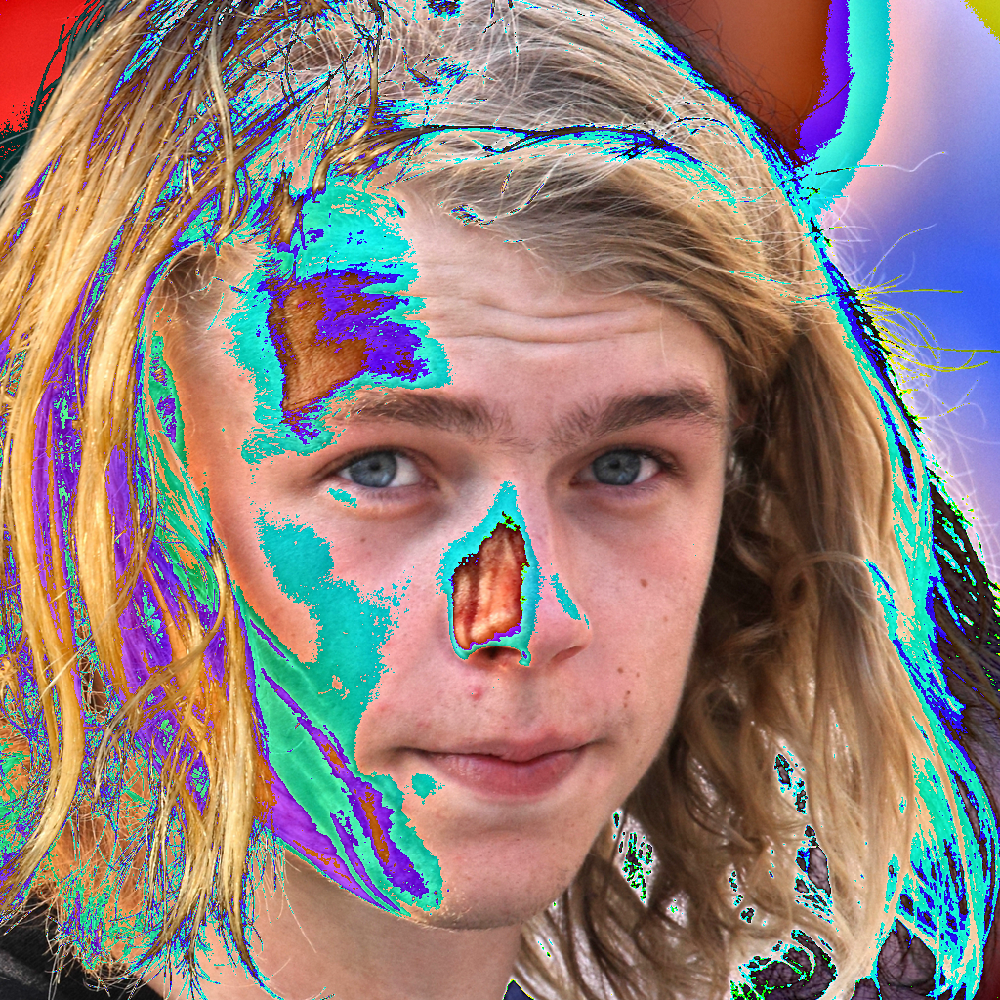

In [37]:
image_tensor = dataset.default_image_transform(image)
to_im_transform(image_tensor)

In [24]:
import os
from PIL import Image

processed_path = "/home/sasedov/StyleDomain/FFHQ_featureshift_processed_2"

images = []
e4e_inversions = []
fse_inversions = []

for ind in range(100):
    image_dir_path = dataset.processed_path / dataset.index[ind]
    filename = os.path.basename(os.path.normpath(image_dir_path))
    
    image_path = list(image_dir_path.glob("image.*"))[0]
    e4e_inversion_path = list(image_dir_path.glob("e4e_inversion.*"))[0]
    fse_inversion_path = list(image_dir_path.glob("fse_inversion.*"))[0]
    
    images.append(Image.open(image_path))
    e4e_inversions.append(Image.open(e4e_inversion_path))
    fse_inversions.append(Image.open(fse_inversion_path))

In [34]:
import numpy as np

np_images = np.array([np.array(x) for x in images])
images_mean = np.mean(np_images, axis=(0,1,2))

In [36]:
images_mean

array([131.20680698, 109.38688229, 100.88784592])

In [37]:
np_images = np.array([np.array(x) for x in e4e_inversions])
e4e_inversions_mean = np.mean(np_images, axis=(0,1,2))

In [38]:
e4e_inversions_mean

array([129.82956607, 107.76458228,  99.53041006])

In [39]:
np_images = np.array([np.array(x) for x in fse_inversions])
fse_inversions_mean = np.mean(np_images, axis=(0,1,2))

In [40]:
fse_inversions_mean

array([127.34615561, 106.37237779,  98.87416798])